# Исследование рынка заведений общественного питания Москвы
**Цель проекта**

Для открытия нового заведения общественного питания необходимо определить:
* определить оптимальный тип заведения: кафе, рестоан, пиццерия или др.;
* определить ценовой диапазон популярных блюд;
* определить подходящее место для заведения.

**План исследования**
1. Распределении заведений по категориям.
2. Количество посадочных мест.
3. Соотношение сетевых и несетевых заведений.
5. Топ-15 самых крупных сетей.
6. Распределение заведений по округам.
7. Рейтинги заведений.
8. Топ-15 улиц по количеству заведений.
9. Улицы, на которых находится только один объект общепита.
10. Распределение среднего чека по районам.
11. Исследование кофеен.


**Предоставлены данные**
Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* «Средний счёт: 1000–1500 ₽»;
* «Цена чашки капучино: 130–220 ₽»;
* «Цена бокала пива: 400–600 ₽».
и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
     * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
     * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
     * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    * 0 — заведение не является сетевым
    * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.


## Предобработка данных

In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
from plotly import graph_objects as go
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster
import numpy as np

try:
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')


In [3]:
def pred(df):
    '''функция предобработки данных'''
    print(df.head())
    print('='*50)
    print(df.info())
    print('='*50)
    print('ПРОПУСКИ')
    print(df.isna().sum())
    print('='*50)
    print('ПОЛНЫЕ ДУБЛИКАТЫ')
    print(df.duplicated().sum())
    print('='*50)
    print(df.describe().round(2))  


In [4]:
pred(df)

                   name  category                              address  \
0                WoWфли      кафе           Москва, улица Дыбенко, 7/1   
1        Четыре комнаты  ресторан   Москва, улица Дыбенко, 36, корп. 1   
2                 Хазри      кафе       Москва, Клязьминская улица, 15   
3  Dormouse Coffee Shop   кофейня  Москва, улица Маршала Федоренко, 12   
4             Иль Марко  пиццерия      Москва, Правобережная улица, 1Б   

                          district  \
0  Северный административный округ   
1  Северный административный округ   
2  Северный административный округ   
3  Северный административный округ   
4  Северный административный округ   

                                               hours        lat        lng  \
0                             ежедневно, 10:00–22:00  55.878494  37.478860   
1                             ежедневно, 10:00–22:00  55.875801  37.484479   
2  пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...  55.889146  37.525901   
3             

В исходных данных описаны 8406 заведений, полные дубликаты отсутствуют.

Данные в нужных форматах.

Присутствует большое количество пропусков в данных:
* режим работы (hours) - вероятно не заполнены составителями профилей;
* ценовая категория (price) - вероятно данные формируются на основе цен в меню, загруженном составителем профиля;
* средний чек (avg_bill) - в данных также много попусков, но информация полнее, чем о ценовой категории. Нет информации, как формируются данные, поэтому сложно предположить природу пропусков;
* оценка среднего чека (middle_avg_bill) - данные присутствуют только для заведений, где имеет место средний чек за блюдо и данные указаны в avg_bill;
* оценка средней цены чашки кофе (middle_coffee_cup) - данные вероятно присутствуют только для кофеен, для которых указаны эти данные;
* количество посадочных мест (seats) - вероятно не заполнены составителями профилей.

Причина отсутствия данных: скорее всего они не заполнены составителями профилей либо не оценены посетителями.

По указанным данным:
* средний чек составляет 954р., минимальный - 0р., максимальный - 35000р.;
* средняя стоимость чашки кофе - 174р., минимальная - 60р., максимальная - 1586р.;
* медианное значение количества мест - 75, минимальное - 0, максимальное - 1288. 

Максимальные значения среднего чека и стоимости 1 чашки кофе выглядят достаточно высокими: либо это ошибка, либо элитные заведения.

Минимальный средний чек 0 - явно ошибочный.

### Заполнение пропусков

*На неизвестные строковые значения: режим работы, рейтинг цен и средний чек поставим заглушку в виде "-".*

In [5]:
#замена пропусков в режиме работы
df['hours'] = df['hours'].fillna('-')
df['price'] = df['price'].fillna('-')
df['avg_bill'] = df['avg_bill'].fillna('-')

### Проверка неявных дубликатов

*Чтобы избежать дублей по названию типа "Крошка Картошка" и "Крошка картошка", приведём значения к нижнему регистру.*

In [6]:
#приведение всех названий к нижнему регистру
df['name'] = df['name'].str.lower()

In [7]:
#проверка неявных дубликатов
print('Дубликатов по адресам и названиям:', df[['name', 'address']].duplicated().sum())
print('Дубликатов по координатам и названиям: ', df[['lat', 'lng', 'name']].duplicated().sum())

Дубликатов по адресам и названиям: 3
Дубликатов по координатам и названиям:  1


In [8]:
df.loc[df[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,-,-,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,-,-,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,-,-,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,-,-,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,-,-,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,-,55.738449,37.410937,4.1,-,-,NaN,NaN,0,276.0


*Дубликаты отличесются показателем "сеть". Чтобы узнать, какой оставить, проверим количество заведений с этими названиями*

In [9]:
df.loc[df[['lat', 'lng', 'name']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,-,-,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,-,-,NaN,NaN,1,188.0


*Дубль по названию и координатам повторяет дубль по названию и адресу.*

In [10]:
dup_names = ['more poke', 'хлеб да выпечка', 'раковарня клешни и хвосты']
df.query('name in @dup_names').sort_values('name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,-,-,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,-,-,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,-,-,NaN,NaN,1,NaN
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,-,-,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,-,-,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,-,-,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,-,55.738449,37.410937,4.1,-,-,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,-,-,NaN,NaN,1,NaN


*Все заведения - сетевые. Принято решение удалить "несетевые" дубликаты.*

In [11]:
#удаление дубликатов
df = df.sort_values(['name', 'chain']).drop_duplicates(subset=['name', 'address'], keep='last').reset_index(drop=True)
df_full = len(df) #создадим переменную длины исходных данных без дубликатов для последующего контроля очистки данных.
df_full

8403

In [12]:
#уникальных несетевых названий
print(df.loc[df['chain'] == 0, 'name'].value_counts().head(30))
print()
print('Несетевых заведений с уникальным названием:' , (df.loc[df['chain'] == 0, 'name'].value_counts()==1).sum())

кафе                    189
шаурма                   43
ресторан                 34
столовая                 28
бистро                   12
кофейня                  12
кафе-столовая             9
буфет                     8
трапезная                 7
шашлычная                 6
поминальные обеды         5
пиццерия                  3
блины                     3
espresso bar              2
донер & гриль             2
на углях                  2
hellopapaya               2
центр плова               2
авлабар                   2
ням-ням                   2
бишкек сити               2
il pizzaiolo              2
кафе шашлык               2
vabene                    2
домик в саду              2
ku: рамен изакая бар      2
вкусвилл, кафе            2
di villaggio              2
pasta cup & pizza         2
важная персона            2
Name: name, dtype: int64

Несетевых заведений с уникальным названием: 4735


Анализ несетевых названий показал большое количество "no name" заведений: 
* 189 Кафе, 
* 43 Шаурмы, 
* 34 Ресторана и тд. 

Являются они сетевыми или нет в реальности - непонятно, т.к. нет информации о юр. лице или каком-то ином общем позиционировании заведений. 

In [13]:
pd.set_option('display.max_rows', None)
temp5 = df.loc[df['chain'] == 0].groupby('name').agg({'name':'count'})
temp6 = temp5.loc[temp5['name']==2].index.to_list()
df.query('name.isin(@temp6)==True')[['name', 'category', 'address']]

,name,category,address
158,bb grill,"бар,паб","Москва, Семёновская площадь, 1"
159,bb grill,"бар,паб","Москва, Автозаводская улица, 18"
367,carrots and beans,кофейня,"Москва, Ярцевская улица, 31"
368,carrots and beans,кофейня,"Москва, Малая Грузинская улица, 38"
714,di villaggio,пиццерия,"Москва, Профсоюзная улица, 45"
715,di villaggio,кафе,"Москва, парк Тюфелева роща"
815,espresso bar,кафе,"Москва, Звенигородское шоссе, 3Ас1"
816,espresso bar,кофейня,"Москва, Южнопортовая улица, 18"
1052,han cook,ресторан,"Москва, Никольская улица, 10"
1053,han cook,быстрое питание,"Москва, улица Вавилова, 64/1с1"


Среди заведений с относительно уникальным названием и имеющим одного "двойника" не выявлено какой-то системы. Все пары заведений находятся на разных адересах, некоторые имеют разный тип (пиццерия и кафе). Предположительно это могут быть: 2 заведения разного направления под одним брендом, переехавшие заведения(одно из них закрыто). 

Нет оснований считать такие заведения сетевыми. 

In [14]:
#проверка сетевых заведений, отмеченных как несетевые
temp10 = df.groupby('name')['chain'].mean().reset_index().query('(chain > 0.5) & (chain < 1)')
temp10

,name,chain
51,abc coffee roasters,0.800000
246,burger club,0.833333
376,coffee point,0.666667
598,flip,0.666667
856,korean chick,0.833333
1106,noba coffee,0.800000
1116,nova bubble tea,0.666667
1137,one price coffee,0.986111
1139,one&double,0.800000
1197,pho street,0.750000


Для названий, среднее значение "chain" > 0.5 - большая часть заведений отмечена как сетевые. Принято решение внести изменения в признак сети. 

In [15]:
#замена признака сети
df.loc[df['name'].isin(temp10['name'].to_list()) == True, 'chain'] = 1

In [16]:
#уникальных сетей
print(df.loc[df['chain'] == 1, 'name'].value_counts())
print()

print('"Сетей" из одного заведения:' , (df.loc[df['chain'] == 1, 'name'].value_counts()==1).sum())
print('Сетей:' , (df.loc[df['chain'] == 1, 'name'].value_counts()>1).sum())
print('Сетевых заведений: ', df.loc[df['chain']==1, 'name'].count() - (df.loc[df['chain'] == 1, 'name'].value_counts()==1).sum())

шоколадница                               120
домино'с пицца                             77
додо пицца                                 74
one price coffee                           72
яндекс лавка                               69
cofix                                      65
prime                                      50
хинкальная                                 44
кофепорт                                   42
кулинарная лавка братьев караваевых        39
теремок                                    38
чайхана                                    37
cofefest                                   32
буханка                                    32
му-му                                      27
drive café                                 24
кофемания                                  23
крошка картошка                            22
андерсон                                   22
cinnabon                                   20
скалка                                     20
french bakery                     

Проверим, есть ли опечатки в названиях "сетей" из одного заведения

In [17]:
#уникальные названия сетей, с группировкой по категории
pd.set_option('display.max_rows', None)
temp3 = df.loc[df['chain'] == 1].groupby('name').agg({'name':'count'})
temp4 = temp3.loc[temp3['name']>1].index.to_list()
temp8 = df.query('name.isin(@temp4)==True')[['category', 'name']].sort_values(['category', 'name']).drop_duplicates()
temp8

,category,name
227,"бар,паб",bon lavash
245,"бар,паб",brasserie lambic
279,"бар,паб",brooms
303,"бар,паб",burger heroes
812,"бар,паб",eshak
878,"бар,паб",flip
911,"бар,паб",frank by баста
1075,"бар,паб",hite
1147,"бар,паб",istanbul
1198,"бар,паб",kaya coffee shop


In [18]:
#уникальные названия единичных "сетей", с группировкой по категории
temp = df.loc[df['chain'] == 1].groupby('name').agg({'name':'count'})
temp1 = temp.loc[temp['name']==1].index.to_list()
df.query('name.isin(@temp1)==True')[['category', 'name']].sort_values(['category', 'name'])

,category,name
3393,"бар,паб",городок
4899,"бар,паб",крепери
5832,"бар,паб",парк
5919,"бар,паб",пивбар
7363,"бар,паб",хинкали
5872,булочная,пекарня № 1
1825,быстрое питание,ploveberry
5165,быстрое питание,ливан хаус
5166,быстрое питание,ливан хаус
7464,быстрое питание,хинкальная экспресс


In [19]:
pd.reset_option('display.max_rows', None)

In [20]:
#произведём замены
df.loc[df['name'] == 'чайхона № 1', 'name'] = 'чайхона №1'
df.loc[df['name'] == 'ливан хаус', 'name'] = 'ливан хаус'

Принято решение изменить признак сетевого заведения для "сетей из одного заведения". 

In [21]:
one_place_chain = df.loc[df['chain'] == 1].groupby('name').agg({'name':'count'})
one_place_chain_names = one_place_chain.loc[one_place_chain['name']==1].index.to_list()
df.loc[df['name'].isin(one_place_chain_names)==True, 'chain'] = 0

Итого после замен:

In [22]:
print('"Сетей" из одного заведения:' , (df.loc[df['chain'] == 1, 'name'].value_counts()==1).sum())
print('Несетевых заведений: ', df.loc[df['chain'] == 0, 'name'].count())
print('Сетей:' , df.loc[df['chain'] == 1, 'name'].nunique())
print('Сетевых заведений: ', df.loc[df['chain']==1, 'name'].count())

"Сетей" из одного заведения: 0
Несетевых заведений:  5227
Сетей: 685
Сетевых заведений:  3176


### Проверка аномалий

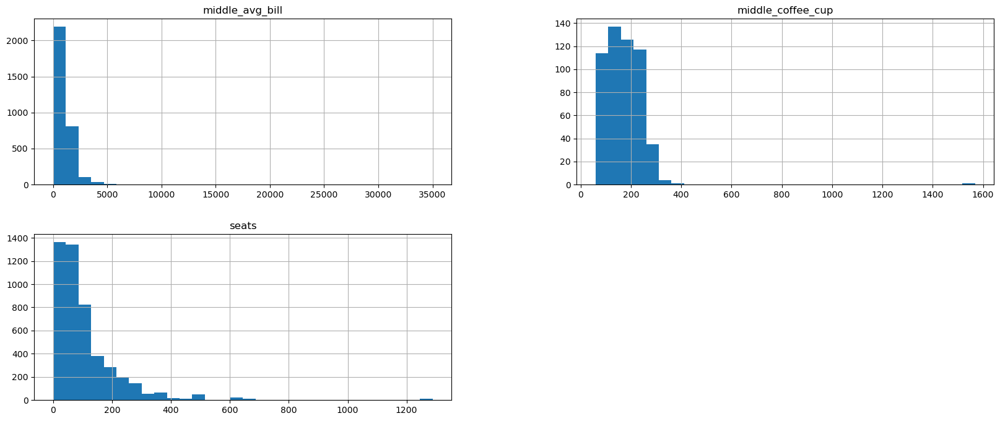

In [23]:
#гистограммы по столбцам с аномалиями
df[['middle_avg_bill', 'middle_coffee_cup', 'seats']].hist(bins=30, figsize=(20, 8))
plt.show()

На графике видно, основная масса:
* средних чеков не превышает 6000р.
* средняя стоимость чашки кофе не превышает 300р.
* явные аномалии в количестве мест - свыше 280 человек.

In [24]:
df.loc[df['middle_avg_bill'] > 6000].sort_values('middle_avg_bill', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4310,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0
7869,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
3404,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
2373,white rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
53,800°с contemporary steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
5295,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
7586,чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0


Набольшее подозрение вызывают:
* бар, паб Чойхона на Дмитровском шоссе, 95А - отзывы и внешний вид не подтверждают информацию о высоких ценах.
* ресторан Кафе на Каширском шоссе, 23, стр. 2 - находится на территории больницы. Отзывы подтверждают высокий уровень цен. Средний чек может быть связан с коллективным обслуживанием пациентов. Тем не менее, непонятно как эта информация попала на сервис Яндекс.Карты и могла ли иметь место опечатка.

Принято решение уджалить аномалии.

In [25]:
#удаление аномальных значений
df = df.loc[(df['middle_avg_bill'] < 11000)|(df['middle_avg_bill'].isna()==True)]

In [26]:
df.loc[df['middle_coffee_cup'] > 300].sort_values('middle_coffee_cup', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8122,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0
498,coffee fm,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.754233,37.715491,4.3,-,Цена чашки капучино:250–500 ₽,NaN,375.0,0,190.0
4551,кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.757292,37.595033,4.3,средние,Цена чашки капучино:279–378 ₽,NaN,328.0,1,30.0
8102,шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.807331,37.580716,4.1,средние,Цена чашки капучино:300–350 ₽,NaN,325.0,1,61.0
3586,диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.719000,37.582203,4.3,средние,Цена чашки капучино:250–390 ₽,NaN,320.0,0,30.0
1129,il tocco,кофейня,"Москва, Ходынский бульвар, 11А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–22:00",55.785455,37.530359,4.1,средние,Цена чашки капучино:280–350 ₽,NaN,315.0,0,NaN


In [27]:
#проверка нудевого среднего чека
df.loc[df['middle_avg_bill'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4807,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


Обнаружено одно значение, в данных о среднем чеке явно ошибка, принято решение удалить ошибочное значение.

In [28]:
#удаление значения
df.loc[df['middle_avg_bill']==0, 'avg_bill'] = '-'
df.loc[df['middle_avg_bill']==0, 'middle_avg_bill'] = np.nan


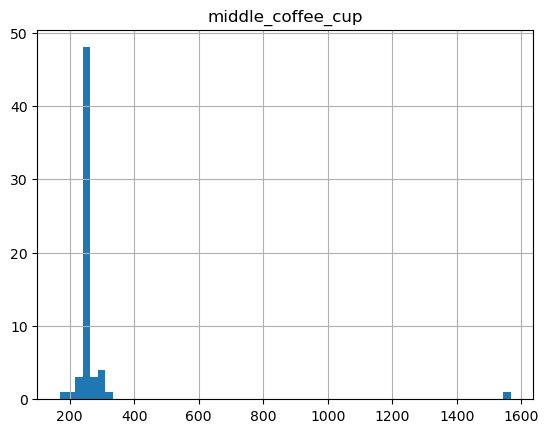

In [29]:
df.loc[df['name']=='шоколадница', ['name', 'middle_coffee_cup']].hist(bins=60)
plt.show()

Аномально высокая максимальная стоимость чашки кофе в одной из кофеин сети "Шоколадница", при этом нижний порог цены - 230р. - не выделяется из остальных. Средняя стоимость кофе по всей сети составляет от 170 до 350р. Полагаю, что в данных опечатка и верхний порог стоимости кофе в "Шоколаднице" на Большой Семёновской улице, 27 составляет 290р. 

In [30]:
#исправление в стоимости кофе
df.loc[df['avg_bill']=='Цена чашки капучино:230–2907 ₽', 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
df.loc[df['middle_coffee_cup']==1568.0, 'middle_coffee_cup'] = (230+290)/2

In [31]:
#проверка количества мест
df.loc[df['seats']>=280].sort_values('seats', ascending=False)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8383,японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,-,55.657255,37.481547,4.4,-,-,NaN,NaN,1,1288.0
81,alternative coffee,кофейня,"Москва, проспект Вернадского, 41, стр. 1",Западный административный округ,"пн-пт 09:00–21:00; сб,вс 09:00–22:00",55.673128,37.502992,4.3,-,-,NaN,NaN,0,1288.0
1333,loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,-,-,NaN,NaN,0,1288.0
5925,пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,-,55.657133,37.481508,4.5,-,-,NaN,NaN,0,1288.0
5558,мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,-,-,NaN,NaN,1,1288.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1937,ricers,ресторан,"Москва, улица Академика Анохина, 58",Западный административный округ,"ежедневно, 10:00–23:00",55.650316,37.469068,4.4,-,-,NaN,NaN,0,280.0
4935,кувшин,ресторан,"Москва, улица Академика Анохина, 58",Западный административный округ,"ежедневно, 12:00–23:00",55.650134,37.469377,4.6,-,-,NaN,NaN,0,280.0
1547,odo sushi bar,ресторан,"Москва, Шмитовский проезд, 39, корп. 1",Центральный административный округ,"ежедневно, 11:00–23:00",55.754352,37.523042,4.4,-,-,NaN,NaN,0,280.0
1428,milk&beans,кофейня,"Москва, Шмитовский проезд, 39, корп. 1",Центральный административный округ,"ежедневно, 08:00–22:00",55.754618,37.524067,4.2,-,-,NaN,NaN,1,280.0


In [32]:
#рассмотрим самые большие заведения: свыше 400 мест.
df.loc[df['seats']>=400].value_counts(['seats'])

seats 
625.0     23
500.0     21
480.0     13
400.0     11
1288.0    11
450.0      6
650.0      6
495.0      6
428.0      5
478.0      4
1040.0     4
455.0      4
644.0      2
491.0      2
660.0      2
920.0      2
481.0      2
585.0      2
420.0      1
600.0      1
430.0      1
675.0      1
760.0      1
1200.0     1
dtype: int64

Большие количсетва мест имеют до 23-х повторений. Выведем эти заведения.

In [33]:
pd.set_option('display.max_rows', None)
df.loc[df['seats']>=400, ['seats', 'address', 'category', 'name']].sort_values(['seats', 'address', 'category'])

,seats,address,category,name
3354,400.0,"Москва, 1-я Тверская-Ямская улица, 2, стр. 1","бар,паб",гастрорюмочная шесть you шесть
1133,400.0,"Москва, 1-я Тверская-Ямская улица, 2, стр. 1",пиццерия,il патио
2178,400.0,"Москва, Комсомольский проспект, 28","бар,паб",tgi fridays
6889,400.0,"Москва, Комсомольский проспект, 28","бар,паб",сыто пьяно
3305,400.0,"Москва, Комсомольский проспект, 28",кафе,вьетнамская еда фобою
5213,400.0,"Москва, Комсомольский проспект, 28",кафе,люстра
7229,400.0,"Москва, Комсомольский проспект, 28",кафе,филипповъ
614,400.0,"Москва, Комсомольский проспект, 28",кофейня,cofix
1135,400.0,"Москва, Комсомольский проспект, 28",пиццерия,il патио
7574,400.0,"Москва, Комсомольский проспект, 28",ресторан,цимес


Часто повторяющиеся аномально высокие цифры посадочных мест коррелируют с адресами - вероятно это фудкорты, либо заведения в крупных бизнес-центрах, рассчитанные на большую единовременную загрузку(обеденное время). Предположим, то заведения с количеством мест от 280 до 400 имеют схожее назначение.

In [34]:
pd.reset_option('display.max_rows', None)

In [35]:
print('Доля заведений в условных фудкортах:', round(len(df.loc[df['seats']>=280].sort_values('seats', ascending=False))*100 / len(df), 2), '%')

Доля заведений в условных фудкортах: 4.11 %


Эти заведения являются специфическими, их немного. Принято решение данные удалить.

In [36]:
#удаление аномалий
df = df.loc[(df['seats']<280) | (df['seats'].isna()==True)]

In [37]:
#количество мест в яндекс лавках
df.loc[df['name']=='яндекс лавка', ['seats']].value_counts()

seats
0.0      4
40.0     4
200.0    2
25.0     2
45.0     2
20.0     2
75.0     2
90.0     1
184.0    1
180.0    1
124.0    1
100.0    1
96.0     1
64.0     1
65.0     1
55.0     1
46.0     1
27.0     1
24.0     1
22.0     1
250.0    1
dtype: int64

Отметим сервис доставки еды Яндекс.Лавка - у сервиса нет своих залов, но на картах присутствует количество мест. Количество мест практически не повторяется, данные не похожи на случайные цифры. Предположительно, это точки при других заведениях. Теоретически, эти места могут быть использованы при покупке еды в Яндекс.Лавке, поэтому оставим данные как есть. 

In [38]:
print('Удалено', round((df_full-len(df))*100/df_full, 2), '% данных.')

Удалено 4.13 % данных.


In [39]:
print('Несетевых заведений: ', df.loc[df['chain'] == 0, 'name'].count())
print('Сетей:' , df.loc[df['chain'] == 1, 'name'].nunique())
print('Сетевых заведений: ', df.loc[df['chain']==1, 'name'].count())

Несетевых заведений:  5036
Сетей: 684
Сетевых заведений:  3020


### Добавление столбцов

*Данные адресов Яндекс.Карт унифицированы: город, улица, номер дома и корпус разделены запятыми. В данном случае, улицу мы можем получить разделив адрес на список и выделив второй элемент.*

In [40]:
#добавление столбца улицы
df['street'] = df['address'].str.split(',', expand=True)[1]
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,#кешбэккафе,кафе,"Москва, Большая Татарская улица, 11С",Центральный административный округ,пн-пт 09:00–17:00,55.740589,37.634106,4.0,-,-,NaN,NaN,0,NaN,Большая Татарская улица
1,+39 pizzeria mozzarella bar,пиццерия,"Москва, Столярный переулок, 3, корп. 12",Центральный административный округ,"пн-чт 12:00–22:00; пт,сб 12:00–23:00; вс 12:00...",55.764166,37.568816,4.8,-,-,NaN,NaN,0,NaN,Столярный переулок
2,1 этаж,кафе,"Москва, улица Костякова, 6/5",Северный административный округ,"ежедневно, 10:00–23:00",55.811759,37.572959,4.3,-,-,NaN,NaN,0,40.0,улица Костякова
3,1-я креветочная,кафе,"Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"пн-чт 10:00–21:00; пт,сб 10:00–22:00; вс 10:00...",55.657956,37.751574,3.7,-,-,NaN,NaN,0,0.0,Мячковский бульвар
4,10 идеальных пицц,ресторан,"Москва, улица Свободы, 48, стр. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.848528,37.454201,4.3,-,-,NaN,NaN,1,110.0,улица Свободы


In [41]:
#режим работы
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,#кешбэккафе,кафе,"Москва, Большая Татарская улица, 11С",Центральный административный округ,пн-пт 09:00–17:00,55.740589,37.634106,4.0,-,-,NaN,NaN,0,NaN,Большая Татарская улица,False
1,+39 pizzeria mozzarella bar,пиццерия,"Москва, Столярный переулок, 3, корп. 12",Центральный административный округ,"пн-чт 12:00–22:00; пт,сб 12:00–23:00; вс 12:00...",55.764166,37.568816,4.8,-,-,NaN,NaN,0,NaN,Столярный переулок,False
2,1 этаж,кафе,"Москва, улица Костякова, 6/5",Северный административный округ,"ежедневно, 10:00–23:00",55.811759,37.572959,4.3,-,-,NaN,NaN,0,40.0,улица Костякова,False
3,1-я креветочная,кафе,"Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"пн-чт 10:00–21:00; пт,сб 10:00–22:00; вс 10:00...",55.657956,37.751574,3.7,-,-,NaN,NaN,0,0.0,Мячковский бульвар,False
4,10 идеальных пицц,ресторан,"Москва, улица Свободы, 48, стр. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.848528,37.454201,4.3,-,-,NaN,NaN,1,110.0,улица Свободы,True


In [42]:
#проверка других возможных написаний времени, указывающих на работу 24/7
print('пн-вс:', len(df.query('hours.str.contains("пн-вс") == True')))
print('00:00–24:00:', len(df.query('hours.str.contains("00:00–24:00") == True')))
print('00:01–24:00:', len(df.query('hours.str.contains("00:01–24:00") == True')))

пн-вс: 0
00:00–24:00: 0
00:01–24:00: 0


*других обозначений ежедневоной круглосуточной работы не выявлено.*

In [43]:
df.describe().round(2)

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8056.00,8056.00,8056.00,2988.00,513.00,8056.00,4445.00
mean,55.75,37.61,4.23,933.53,172.69,0.37,83.32
std,0.07,0.10,0.47,784.75,65.66,0.48,64.13
min,55.57,37.36,1.00,30.00,60.00,0.00,0.00
25%,55.70,37.54,4.10,375.00,125.00,0.00,40.00
50%,55.75,37.61,4.30,700.00,169.00,0.00,68.00
75%,55.80,37.67,4.40,1250.00,225.00,1.00,114.00
max,55.93,37.87,5.00,10000.00,375.00,1.00,276.00


### Выводы
В ходе предобработки:
* отсутствующие данные в формате строк заполнены заглушками;
* найдены и удалены 3 неявных дубликата;
* удалено значение среднего чека, равного нулю, у обного заведения;
* испарвлен признак сетевого заведения для объектов с уникальными названиями для 60 заведенй;
* удален 4.13% данных как аномалии.

Большое количество отсутствующих данных о режиме работы, категории цены и среднем чеке обусловлено незаполненностью профилей большого количества заведений.

Итого после преобработки данные включают:
* Всего заведений: 8056,
* Несетевых заведений:  5036,
* Сетей: 684,
* Сетевых заведений:  3020.

По указанным данным:
* медианный средний чек составляет 700р., минимальный - 30р., максимальный - 10000р.;
* медианная стоимость чашки кофе - 169р., минимальная - 60р., максимальная - 375р.;
* медианное значение количества мест - 68, минимальное - 0, максимальное - 276.


## Анализ данных

### Категории заведений

In [44]:
#Растпределение заведений по категориям
df_cat = df.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
df_cat.rename(columns = {'name':'count'}, inplace = True)
df_cat['part'] = (df_cat['count'] / df_cat['count'].sum()).round(2)
print(df_cat)

fig = go.Figure()
fig.add_trace(go.Bar(x = df_cat['category'], y = df_cat['count'], name = 'Среднее значение', text=df_cat['count']))
fig.update_traces(text=df_cat['count'],  selector=dict(type='bar'))

fig.update_layout(
    title="Количество заведений по категориям",
    xaxis_title="Категория",
    yaxis_title="Количество заведений",    
    barmode='overlay',
    height=600, 
    width=800)
fig.update_traces(hoverinfo="none", selector=dict(type='bar'))

fig.show()

          category  count  part
0             кафе   2305  0.29
1         ресторан   1934  0.24
2          кофейня   1351  0.17
3          бар,паб    717  0.09
4         пиццерия    612  0.08
5  быстрое питание    582  0.07
6         столовая    306  0.04
7         булочная    249  0.03


<img alt="Категории заведений" src="raw.githubusercontent.com/evgeniyadubs/Portfolio/main/Rynok_obshepita_Moskvy/img/kolichestvo-zavedenii-po-kategoriyam.png"> 


<img alt="Категории заведений" src="img/kolichestvo-zavedenii-po-kategoriyam.png"> 


![Категории заведений](img/kolichestvo-zavedenii-po-kategoriyam.png)

Больше половины всех заведений составляют топ-3 категорий:
1. кафе - 29%,
2. рестораны - 24%,
3. кофейни - 17%.

In [45]:
#медианный средний чек по категориям:
df_cat_avg_bill = df.groupby('category')['middle_avg_bill'].median().round(2).sort_values(ascending=False).reset_index()
df_cat_avg_bill

,category,middle_avg_bill
0,"бар,паб",1250.0
1,ресторан,1250.0
2,пиццерия,600.0
3,кафе,550.0
4,булочная,435.0
5,кофейня,400.0
6,быстрое питание,375.0
7,столовая,300.0


Данные показали, что медианный средний чек:
* самый высокий в ресторанах и барах - 1250р.;
* в пиццериях и кафе - 550-600р.;
* булочных и кофейнях - 400-435р.;
* заведениях быстрого питания и столовой - 300-370р.

Суммы кореллируют со стоимостью заказа на 1 человека: блюдо(десерт) + напиток или 2-3х напитков в баре; комплексного обеда для столовых. Большинство бюдей платят сами за себя, даже если приходят не одни.

### Количество посадочных мест

In [46]:
#Количество посадочных мест по категориям
df_seats_cat = df.groupby('category').agg({'seats':['min', 'mean', 'median']}).droplevel(level=0, axis=1).reset_index().sort_values('median', ascending=False).round(2)
df_seats_cat

,category,min,mean,median
6,ресторан,0.0,94.42,80.0
0,"бар,паб",0.0,87.67,76.0
7,столовая,0.0,78.55,70.0
4,кофейня,0.0,83.12,69.0
2,быстрое питание,0.0,81.16,60.0
3,кафе,0.0,75.14,53.0
5,пиццерия,0.0,76.84,50.0
1,булочная,0.0,75.15,48.0


In [47]:
#количество мест по категориям заведений 
fig = go.Figure()
fig.add_trace(go.Bar(x = df_seats_cat['category'], y = df_seats_cat['mean'], name = 'Среднее значение', opacity=0.4, text=df_seats_cat['mean']))
fig.update_traces(text=df_seats_cat['mean'],  selector=dict(type='bar'))
fig.add_trace(go.Bar(x = df_seats_cat['category'], y = df_seats_cat['median'], name = 'Медиана', text=df_seats_cat['median'],))


fig.update_layout(
    title="Количество посадочных мест по категориям заведений ",
    xaxis_title="Категория",
    yaxis_title="Количество мест",    
    barmode='overlay',
    height=600, 
width=800)
fig.update_traces(hoverinfo="none", selector=dict(type='bar'))

fig.show()

Топ-3 по наибольшему типичному количество мест:
1. рестораны;
2. бары, пабы;
3. кофейни и столовые.

Заведения с большим количеством посадочных мест встречаются во всех категориях, т.к. среднее превышает медиану. Однако, в основной своей массе с большим количеством посадосных мест:
* рестораны,
* бары,
* столовые,
* кофейни,

Чаще небольшие:
* кафе,
* пиццерии,
* булочные.

Самые крупные - рестораны. Предположительно, это связано с тем, что люди проводят в ресторанах и барах больше времени, чем в других заведениях. Часто рестораны становятся площадкой для массовых торжеств. 

Столовые и бары рассчитаны на большую загрузку в несколько пиковых часов в сутки.

В булочные часто заходят просто чтобы купить изделия на вынос, следовательно, большие площади булочных не нужны. 

### Сетевые заведения

In [48]:
#переименование параметра chain для более понятного вывода на графиках
df_chain = df
df_chain.loc[df_chain['chain'] == 0, 'chain'] = 'Несетевое заведение'
df_chain.loc[df_chain['chain'] == 1, 'chain'] = 'Сетевое заведение'

#### Cоотношение сетевых и несетевых заведений

In [49]:
#соотношени сетевых и несетевых заведений
df_chain_group = df.groupby('chain')['name'].count().reset_index()
df_chain_group = df_chain_group.rename(columns={'name':'count'})

print(df_chain_group)
layout = go.Layout(
    autosize=False,
    width=600,
    height=600)
fig = go.Figure(data=[go.Pie(labels=df_chain_group['chain'], values=df_chain_group['count'])], layout=layout)
fig.update_traces(text=df_chain_group['count'],  selector=dict(type='pie'), textfont_size=14)
fig.update_traces(hovertext=df_chain_group['chain'],  selector=dict(type='pie'))
fig.update_traces(hoverinfo='text',  selector=dict(type='pie'))
fig.show() 

                 chain  count
0  Несетевое заведение   5036
1    Сетевое заведение   3020


Практически треть заведений - несетевые. Можно сделать вывод, что несетевые заведения успешно находят потребителей. 

#### Доли сетевых заведений в категориях

In [50]:
#агрегация данных для сортировки диаграммы
df_chain_sum = df_chain.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
print(df_chain_sum)

fig = px.histogram(df_chain, 
                   x='category', 
                   color='chain',
                   title='Распределение заведений по категориям',
                   category_orders={'category': df_chain_sum['category']},
                   width=800)
fig.update_xaxes(title_text='Категория') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений') # подпись для оси Y
fig.update_traces(selector=dict(type='histogram'))

fig.show() # выводим график

          category  name
3             кафе  2305
6         ресторан  1934
4          кофейня  1351
0          бар,паб   717
5         пиццерия   612
2  быстрое питание   582
7         столовая   306
1         булочная   249


1. Наибольший разрыв в долях сетевых и несетевых заведений в пользу первых в категориях:
    * кафе,
    * рестораны,
    * бары,
    * быстрое питание,
    * столовые.
    
    
2. Практически равные доли сетей и единичных заведений в категориях:
    * кофейни,
    * пиццерии.
    

3. Преобладают сетевые заведения в категории булочные.

 

Это означает, что конкуренция со стороны сетей для категорий из пункта 1 выражена в меньшей степени. 

Несмотря на всем известные сети быстрого питания, всего треть заведений является сетевыми. Вероятно это связано с большим количеством единичных no-name шаурм, хачапурных и т.п.

Развить несевую булочную будет достаточно сложно. Это может быть связано с тем, что для булочных наиболее выражен локальный спрос. Также средний чек булочной очевидно самый низкий среди всех категорий. Поэтому, для увеличения охвата необходимо открывать несколько заведений. 

#### Популятные сети

In [51]:
#15 крупнейших заведений
df_popular_chains = df_chain.loc[df_chain['chain'] == 'Сетевое заведение'].groupby('name').agg({'category':pd.Series.mode, 'name':'count'})
df_popular_chains = df_popular_chains.rename({'name':'count'}, axis=1)
df_popular_chains = df_popular_chains.sort_values('count', ascending=False).reset_index().head(15)
df_popular_chains

,name,category,count
0,шоколадница,кофейня,113
1,домино'с пицца,пиццерия,77
2,додо пицца,пиццерия,71
3,one price coffee,кофейня,67
4,яндекс лавка,ресторан,66
5,cofix,кофейня,62
6,prime,ресторан,47
7,хинкальная,кафе,44
8,кофепорт,кофейня,40
9,кулинарная лавка братьев караваевых,кафе,38


In [52]:
fig = px.bar(df_popular_chains, 
                   y='count', 
                   x='name',
                   color='category',
                   category_orders={'name': df_popular_chains['name']},
                   title='Количество заведений в популярных сетях',
                   height=600,
                width=800,
            text=df_popular_chains['count'])

fig.update_xaxes(title_text='Название сети')
fig.update_yaxes(title_text='Количество заведений')

fig.show()

Среди топ-5 по количеству заведенйи в сети:
* 2 сети кофеен,
* 2 пиццерии,
* сервис доставки рестораннной еды.

Основную массу топ-15 составляют кофейни и кафе. В топ-15 входит всего одна булочная, несмотря на большой % сетевых заведений в категории. 

Отсутствуют в рейтинге:
* бары и пабы, 
* быстрое питание,
* столовые. 

&ndash; в этих категориях нет крупных сетей.

Кофейни и пиццерии, как правило, небольшие, с низким средним чеком. Предположительно спрос для таких заведений узко локализирован и масштабирование возможно только за счет открытия новых точек. Эту теорию подтверждает половина сетевых заведений в этих категориях.

Отсутствие в рейтинге баров и пабов может быть связано с распространением авторских заведений. Столовых - локализация в бизнес-центре, кампусе, заводе и тд. - у них стабильный спрос и отсутствие конкурентов шаговой доступности и нет необходимости в создании собственного бренда.  

### Заведения по районам

In [53]:
df_dist = df.groupby(['district', 'category']).agg({'name':'count'})
df_dist = df_dist.rename({'name':'count'}, axis=1).sort_values(['district', 'count'], ascending=False).reset_index()

#агрегация данных для сортировки диаграммы
df_dist_sum = df_dist.groupby('district')['count'].sum().reset_index().sort_values(by='count', ascending=False)
df_dist_sum

,district,count
5,Центральный административный округ,2123
3,Северо-Восточный административный округ,867
2,Северный административный округ,853
8,Южный административный округ,828
1,Западный административный округ,790
0,Восточный административный округ,782
6,Юго-Восточный административный округ,708
7,Юго-Западный административный округ,700
4,Северо-Западный административный округ,405


In [54]:
fig = px.bar(df_dist, 
                   y='count', 
                   x='district',
                   color='category',
                   title='Количество заведений в АО',
                   category_orders={'district': df_dist_sum['district']},
                   height=800,
                   width=1000 )

fig.update_xaxes(title_text='Округ')
fig.update_yaxes(title_text='Количество заведений')
fig.show()

Распределение заведений различных категорий по округам демострирует топ-3:
* кафе, 
* рестораны,
* кофейни,

на которые приходится большая часть всех заведений, что соответствует распределению по Москве в целом. 

Исключение составляет Центральный округ, где большую часть также составляют бары и пабы. Это связано с высокой концентранцией туристического потока и деловых кварталов. 

### Рейтинги заведений

#### По категориям

In [55]:
category_rate = df.groupby('category').agg({'rating':'median'}).sort_values('rating', ascending=False)
category_rate.reset_index(inplace=True)
category_rate


,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,кофейня,4.3
3,пиццерия,4.3
4,ресторан,4.3
5,столовая,4.3
6,быстрое питание,4.2
7,кафе,4.2


In [56]:
fig = px.bar(category_rate, 
                   x='category', 
                   y='rating',
                   title='Средний рейтинг заведений каждой категории',
                   text = category_rate['rating'],
                    width=800)

fig.update_yaxes(title_text='Рейтинг')
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(range=[0, 5])  
fig.show()

Максимальный средний рейтинг у пабов и баров, минимальнй у кафе, однако диапазон всего 0,2. 

Более низкий рейтинг кафе и быстрого питания может быть связан с назначением заведений - это места, куда люди ходят в обеденный перерыв при необходимости поесть. Для оценки таких заведений очень много факторов: свежесть и разнообразие блюд, цена, скорость обслуживания и пр. В бары и пабы ходят отдыхать, поэтому менее требовательны к меню. 

#### По округам

In [57]:
district_rate = df.groupby('district').agg({'rating':'median'}).sort_values('rating', ascending=False)
district_rate.reset_index(inplace=True)
district_rate

,district,rating
0,Центральный административный округ,4.4
1,Восточный административный округ,4.3
2,Западный административный округ,4.3
3,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Юго-Западный административный округ,4.3
6,Южный административный округ,4.3
7,Северо-Восточный административный округ,4.2
8,Юго-Восточный административный округ,4.2


In [58]:
with open('admin_level_geomap.geojson', encoding='utf-8') as file:
    file = json.load(file)
state_geo = file
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений',
).add_to(m)

# выводим карту
m   

Разброс рейтинга заведений по районам так же не превышает 0.2: от 4,2 в Юго- и Северо-Восточном округах до 4.4 в Центральном. 

Это означает, что в Центральном районе необходимо соответствовать более высоким стандартам.

### Плотность заведений на карте 

In [59]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m


Необходимость соответствия более высоким стандартам в Центральном округе подтверждается высокой конкуренцией - в центре самое большое сосредоточение заведений. 

### Популярные улицы

In [60]:
top_streets = df.groupby('street').agg({'name':'count'}).sort_values('name', ascending=False).head(15) #поиск топ-15 улиц
df_top_streets = df.loc[df['street'].isin(top_streets.index.to_list())] #фильтрация датафрейма по нужным улицам

#агрегация данных
df_top_streets_ag = df_top_streets.groupby(['street', 'category']).agg({'name':'count'})
df_top_streets_ag = df_top_streets_ag.rename({'name':'count'}, axis=1).reset_index()

top_streets

,name
street,
проспект Мира,182
Профсоюзная улица,122
проспект Вернадского,97
Ленинский проспект,92
Ленинградский проспект,72
Варшавское шоссе,71
Дмитровское шоссе,70
Ленинградское шоссе,69
Каширское шоссе,66


In [61]:
#агрегация данных для сортировки диаграммы
df_top_streets_ag_sum = df_top_streets_ag.groupby('street')['count'].sum().reset_index().sort_values('count', ascending=False)

#график распределения заведений по улицам
fig = px.bar(df_top_streets_ag, 
                   y='count', 
                   x='street',
                   color='category',
                   title='Заведения на популярных улицах',
                   category_orders={'street': df_top_streets_ag_sum['street']},
                   height=800,
                   width=1000)

fig.update_xaxes(title_text='Улица')
fig.update_yaxes(title_text='Количество заведений')
fig.show()

Больше всего заведений расположено на:
* проспекте Мира, 
* Профсоюзной улице,
* проспекте Вернадского,
* Ленинском прспекте. 

Все улицы, за исключением ул. Миклухо-Маклая явяются длинными транспортными магистралями на пути от центра к спальным районам и расположены между Садовым кольцом и МКАД. 

На большинстве улиц основную массу заведений, примерно в равных пропорциях, составляют: 
* кафе, 
* кофейни,
* и рестораны,

Кроме МКАД - где доля кафе значительно выше остальных заведений. 

### Улицы с одним заведением

In [62]:
#улицы только с одним заведением
one_place_street = df.groupby('street').agg({'name':'count'}).sort_values('name', ascending=False).query('name ==1')
df_one_place_street = df.loc[df['street'].isin(one_place_street.index.to_list())]
df_one_place_street.describe().round(2)

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,464.00,464.00,464.00,167.00,24.00,157.00
mean,55.76,37.62,4.24,961.51,186.17,58.87
std,0.06,0.09,0.46,994.57,55.54,48.22
min,55.58,37.39,1.00,67.00,95.00,0.00
25%,55.73,37.56,4.10,325.00,140.00,30.00
50%,55.76,37.61,4.30,650.00,177.50,45.00
75%,55.80,37.67,4.50,1250.00,213.75,80.00
max,55.91,37.87,5.00,7000.00,320.00,240.00


Среди единственных заведений на улице:
* медианный средний чек - 650.00р, от 67 до 7000р.; 
* медианная стоимость чашки кофе - 177р., от 95р. до 177р.;
* медианное количество посадочных мест - 45, от 0 до 240;
* медианный рейтинг - 4.3.

Типичный средний чек немного ниже, а заведения на меньшее количество мест, чем в общен по Москве. Стоимость же чашки кофе превышает медиану по всем заведениям. 

In [63]:
ops_category = df_one_place_street.groupby('category')['name'].agg('count').reset_index()
layout = go.Layout(
    autosize=False,
    width=600,
    height=600)
fig = go.Figure(data=[go.Pie(labels=ops_category['category'], values=ops_category['name'])], layout=layout)
fig.update_traces(text=ops_category['name'], selector=dict(type='pie'),
           textfont_size=14)
fig.update_traces(hovertext=ops_category['category'], selector=dict(type='pie'))
fig.update_traces(hoverinfo='text', selector=dict(type='pie'))
fig.show() 

Больше трети единственных заведений на улице - это кафе, ещё 40% делят рестораны и кафе.

In [64]:
ops_district = df_one_place_street.groupby('district')['name'].agg('count').reset_index()
layout = go.Layout(
    autosize=False,
    width=800,
    height=800)
fig = go.Figure(data=[go.Pie(labels=ops_district['district'], values=ops_district['name'])], layout=layout)

fig.update_traces(text=ops_district['name'], selector=dict(type='pie'),
           textfont_size=14)
fig.update_traces(hovertext=ops_district['district'], selector=dict(type='pie'))
fig.update_traces(hoverinfo='text', selector=dict(type='pie'))
fig.show() 

31% улиц с единственными заведениями засположены в Центральном АО - скорее всего в центре сосредоточено большое количество небольших улиц. 
Ещё 35% в равных долях приходится на Северо-Восточный, Восточный и Северный АО. 

### Цены по районам

In [65]:
district_avg_bill = df.groupby('district')['middle_avg_bill'].median().reset_index().sort_values('middle_avg_bill', ascending=False)
print(district_avg_bill)

fig = px.bar(district_avg_bill, 
                   x='district', 
                   y='middle_avg_bill',
                   title='Средний чек в разных районах',
                   height=600, 
                   width=800,
                   text=district_avg_bill['middle_avg_bill'], 
            )

fig.update_yaxes(title_text='Средний чек, pуб.')
fig.update_xaxes(title_text='Округ')
fig.show()


                                  district  middle_avg_bill
5       Центральный административный округ           1000.0
1          Западный административный округ            950.0
4   Северо-Западный административный округ            687.5
2          Северный административный округ            650.0
7      Юго-Западный административный округ            600.0
0         Восточный административный округ            550.0
3  Северо-Восточный административный округ            500.0
8             Южный административный округ            500.0
6     Юго-Восточный административный округ            444.5


In [66]:
with open('admin_level_geomap.geojson', encoding='utf-8') as file:
    file = json.load(file)
state_geo = file
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек',
).add_to(m)

# выводим карту
m   

Лидером по среднему чеку являются Центральный и Западный округа: 1000р. и 950р.

Ниже 500р. средние чеки в:
* Северо-Восточном,
* Южном,
* Юго-Восточном административных округах.

Для того, чтобы оченить причины такого распределения, необходимо распологать данными о благосостоянии людей, проживающих, либо работающих в этих районах. 

Очевидно, что в Центре расположена наиболее платёжеспособная местная публика, и много туристов. Западный округ считается элитным, на его территории расположены институты и инострнаные посольства. Очевидно, что благосостояние проживающих там людей выше.



### Выводы

**Обзор категорий**

Больше половины всех заведений составляют 3 категории:

1. кафе - 29%,
2. рестораны - 24%,
3. кофейни - 17%.

Медианный средний чек:
* что самый высокий в ресторанах и барах - 1250р.;
* в пиццериях и кафе - 550-600р.;
* булочных и кофейнях - 400-435р.;
* заведениях быстрого питания и столовой - 300-370р.

По количеству посадочных мест самые крупные - рестораны. Предположительно, это связано с тем, что люди проводят в ресторанах и барах больше времени, чем в других заведениях. Часто рестораны становятся площадкой для крупных торжеств. 

Столовые и бары рассчитаны на большую загрузку в несколько пиковых часов в сутки.

В булочные часто заходят просто чтобы купить изделия на вынос, следовательно, большие площади булочных не нужны. 

Типичное количество посадочных мест в:
1. ресторанах - 80;
2. барах, пабах - 76; 
3. кофейнях и столовых - 70. 

Чаще небольшие:
* кафе - в среднем 53 посадочных места;
* пиццерии - на 50 мест;
* булочные - на 48 мест.

**Обзор сетей**

Практически треть заведений - несетевые. Можно сделать вывод, что несетевые заведения успешно находят потребителей.
1. Преобладают несетевые заведения среди:
    * кафе,
    * ресторанах,
    * баров,
    * заведений быстрого питания,
    * столовых.
	
2. Практически равные доли сетей и единичных заведений в категориях:
    * кофейни,
    * пиццерии.

3. Преобладают сетевые заведения в категории булочные.

Это означает, что конкуренция со стороны сетей для категорий из пункта 1 выражена в меньшей степени. Открыть и развить несетевую булочную, скорее всего, будет достаточно сложно.

Основную массу топ-15 самых крупных сетей составляют кофейни и кафе.

Самая крупная сеть - кофейни Шоколадница. Далее 2 пиццерии: Домино'с и Додо. 

Кофейни и пиццерии, как правило, небольшие, со средним чеком порядка 700р. Предположительно спрос для таких заведений узко локализирован и масштабирование возможно только за счет открытия новых точек. Эту теорию подтверждает половина сетевых заведений в этих категориях.

В топ-15 сетей по величине входит всего одна булочная, несмотря на большой % сетевых заведений в категории. 

Отсутствуют в рейтинге:
* бары и пабы, 
* быстрое питание,
* столовые. 

&ndash; в этих категориях нет крупных сетей.

**Обзор заведений по округам**

Распределение заведений различных категорий по округам совпадает с распределением по Москве. Топ-3:
* кафе, 
* рестораны,
* кофейни,

Исключение составляет Центральный округ, где большую часть также составляют бары и пабы. Это связано с высокой концентранцией туристического потока и деловых кварталов. 

Максимальный средний рейтинг у пабов и баров, минимальнй у кафе, однако диапазон всего 0,2. 

Более низкие оценки у кафе: небольших заведений с невысоким средним чеком. Однако, в оценке таких заведений очень много факторов: свежесть и разнообразие блюд, цена, скорость обслуживания и пр.

Разброс рейтинга заведений по районам так же не превышает 0.2: от 4,2 в Юго- и Северо-Восточном округах до 4.4 в Центральном. 

В Центральном округе необходимо соответствовать более высоким стандартам, в том числе и в связи с повышенной конкуренцией.

**Улицы с самым большим количеством заведений**

Больше всего заведений расположено на:
* проспекте Мира, 
* Профсоюзной улице,
* проспекте Вернадского,
* Ленинском прспекте. 

Все улицы, за исключением ул. Миклухо-Маклая явяются транспортными магистралями на пути от центра к спальным районам и расположены между Садовым кольцом и МКАД. 

На большинстве улиц основную массу заведений, примерно в равных пропорциях, составляют: 
* кафе, 
* кофейни,
* и рестораны,

Кроме МКАД - где доля кафе значительно выше остальных заведений. 

**Улицы с единственным заведением**

Среди единственных заведений на улице:
* медианный средний чек - 650р.; 
* медианная стоимость чашки кофе - 177р.;
* медианное количество посадочных мест - 45;
* медианный рейтинг - 4.3.

Типичный средний чек немного ниже, а заведения на меньшее количество мест, чем в общен по Москве. Стоимость же чашки кофе превышает медиану по всем заведениям. 

Больше трети единственных заведений на улице - это кафе, ещё 40% делят рестораны и кофейни.

31% улиц с единственными заведениями засположены в Центральном АО - скорее всего в центре сосредоточено большое количество небольших улиц. 
Ещё 35% в равных долях приходится на Северо-Восточный, Восточный и Северный АО. 

**Обзор цен по округам**

Лидером по среднему чеку являются Центральный и Западный округа: 1000р. и 950р.

Ниже 500р. средние чеки в:

* Северо-Восточном,
* Южном,
* Юго-Восточном административных округах.

Очевидно, что в Центре расположена наиболее платёжеспособная местная публика, и много туристов. Западный округ считается элитным, на его территории расположены институты и инострнаные посольства. Очевидно, что благосостояние проживающих там людей выше.

## Открытие кофейни

### Расположение

In [67]:
df_cafe = df[df['category']=='кофейня']
print('Всего кофеен: ', len(df_cafe))

Всего кофеен:  1351


In [68]:
district_cafe = df_cafe.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
district_cafe = district_cafe.rename({'name':'count'}, axis=1)
district_cafe

,district,count
0,Центральный административный округ,406
1,Северный административный округ,184
2,Северо-Восточный административный округ,156
3,Западный административный округ,140
4,Южный административный округ,117
5,Восточный административный округ,104
6,Юго-Западный административный округ,94
7,Юго-Восточный административный округ,88
8,Северо-Западный административный округ,62


In [69]:
fig = px.bar(district_cafe, 
                   x='district', 
                   y='count',
                   title='Количество кофеен по округам',
                   width=1000,
                   height=600,
                   text=district_cafe['count'])

fig.update_yaxes(title_text='Количество заведений')
fig.update_xaxes(title_text='Округ')
fig.show()

По количеству кофеен с большим отрывом лидирует Центральный АО. Меньше всего - в Северо-Западном. 

### Круглосуточные кофейни

In [70]:
cafe24_7 = df_cafe.groupby('is_24_7')['name'].count().reset_index()
cafe24_7.loc[cafe24_7['is_24_7']==False, 'is_24_7'] = 'Кофейни с перерывами'
cafe24_7.loc[cafe24_7['is_24_7']==True, 'is_24_7'] = 'Круглосуточные кофейни'
cafe24_7 = cafe24_7.rename({'name':'count'}, axis=1)
cafe24_7

,is_24_7,count
0,Кофейни с перерывами,1293
1,Круглосуточные кофейни,58


In [71]:
layout = go.Layout(
    autosize=False,
    width=600,
    height=600)
fig = go.Figure(data=[go.Pie(labels=cafe24_7['is_24_7'], values=cafe24_7['count'])], layout=layout)
fig.update_traces(textfont_size=14)
fig.show() 

Круглосуточных кофеен менее 5% от общего количества. 

### Рейтинги кофеен

In [72]:
district_cafe = df.groupby('district').agg({'rating':'median'}).sort_values('rating', ascending=False)
district_cafe.reset_index(inplace=True)
district_cafe

,district,rating
0,Центральный административный округ,4.4
1,Восточный административный округ,4.3
2,Западный административный округ,4.3
3,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Юго-Западный административный округ,4.3
6,Южный административный округ,4.3
7,Северо-Восточный административный округ,4.2
8,Юго-Восточный административный округ,4.2


In [73]:
fig = px.bar(district_cafe, 
                   x='district', 
                   y='rating',
                   title='Средний рейтинг кофеен в округе',
                   width= 800,
                   height=600,
                text=district_cafe['rating'])

fig.update_yaxes(title_text='Рейтинг')
fig.update_xaxes(title_text='Округ')
fig.update_yaxes(range=[0, 5]) 
fig.show()

In [74]:
with open('admin_level_geomap.geojson', encoding='utf-8') as file:
    file = json.load(file)
state_geo = file
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен',
).add_to(m)

# выводим карту
m   

Средний рейтинг кофеен не отличается от данных по всем заведениям: наибольший - в Центральном округе, наименьший - в Северо-и Юго-Восточных округах. 

Конкуренция и стандарты в ЦЕнтральном районе выше остальных. 

### Цена одной чашки кофе по районам

In [75]:
cafe_avg_cup = df_cafe.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).reset_index()

fig = px.bar(cafe_avg_cup, 
                   x='district', 
                   y='middle_coffee_cup',
                   title='Средняя стоимость чашки кофе в разных районах',
                   height = 600,
                    width= 800,
                    text=cafe_avg_cup['middle_coffee_cup'])

fig.update_yaxes(title_text='Средняя стоимость чашки кофе, pуб.')
fig.update_xaxes(title_text='Округ')

fig.show()


In [76]:
with open('admin_level_geomap.geojson', encoding='utf-8') as file:
    file = json.load(file)
state_geo = file
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_avg_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная цена чашки кофе',
).add_to(m)

# выводим карту
m  

Распределение средней цены чашки кофе по районам отличается от среднего чека ресторанов и кафе:
* самая высокая стоимость в Юго-Западном округе - 198р.,
* чуть ниже в Центральном - 190р.,
* на третьем месте Западный АО - 187р. 
    

### Выводы

Типичная кофейня это заведение:
* со средней стоимостью чашки кофе 169р.;
* на 69 посадочных мест;
* не круглосуточное.

С точки зрения открытия кофейни в первую очередь следует рассмотреть Юго-Западный округ. Причины:
1. самая высокая средняя стоимость чашки кофе - 198р.,
2. небольшое количество кофеен (94) - 6-е место среди 9-ти округов по количеству кофеен;
3. не самый высокий рейтинг среди кофеен - 4.3.

Это означает невысокую конкуренцию и возможность большей выгоды в этом округе. 

Через Юго-Западный округ проходят 2 улицы с наибольшим количеством заведений: Профсоюзная улица и Ленинский проспект на границе с Западным округом - очевидно, что это улицы с большим потоком людей. 

Однако, есть вероятность, что небольшое количество кофеен в этом районе обусловлено невостребованностью такого формата заведений. 

Альтернативный вариант: Центральный район или Западный районы. Там также можно рассчитывать на более обеспеченных посетителей, однако, в Центральном районе конкуренция будет выше. В Западном - можно также столкнуться с невостребованностью формата.   



## Выводы

### Предобработка данных

На основе предоставленных данных проведён анализ информации о 8056 заведениях, среди них:
Итого после преобработки данные включают:
* Несетевых заведений:  5036,
* Сетевых заведений:  3020,
* Сетей: 684.

Для порядка половины данных отсутствует информация о:
* категориии цены, 
* среднем чеке,
* количестве мест.

Информация о режиме работы отсутствует для 1/8 части заведений.

По указанным данным:
* медианный средний чек составляет 700р.;
* медианная стоимость чашки кофе - 169р.;
* медианное значение количества мест - 68.

### Анализ данных

В ходе анализа данных были исследованы:
1. Распределение заведений по категориям.
2. Количество посадочных мест.
3. Типичные сетевые и несетевые заведения.
4. Рейтинги.
5. География заведений.
6. Цены в округах.

Также отдельно рассмострены кофейни на предмет перспективы открытия нового заведения. 

**1. Распределение заведений по категориям.**

Больше половины всех заведений составляют 3 категории:
1. кафе - 29%,
2. рестораны - 24%,
3. кофейни - 17%.

Медианный средний чек:
* что самый высокий в ресторанах и барах - 1250р.;
* в пиццериях и кафе - 550-600р.;
* булочных и кофейнях - 400-435р.;
* заведениях быстрого питания и столовой - 300-370р.

**2. Количество посадочных мест.**

По количеству посадочных мест самые крупные - рестораны, где визит длится, как правило, не менее часа. Часто рестораны становятся площадкой для крупных торжеств. 

Столовые и бары рассчитаны на большую загрузку в несколько пиковых часов в сутки.

В булочных, где в большинстве случаев просто покупают хлеб на вынос, а количество посетителей наиболее ограничено близостью проживания людей, нет необходимости в большом количестве мест. 

Типичное количество посадочных мест в:
1. ресторанах - 80;
2. барах, пабах - 76; 
3. кофейнях и столовых - 70. 

Чаще небольшие:
* кафе - в среднем 53 посадочных места;
* пиццерии - на 50 мест;
* булочные - на 48 мест.

**3. Типичные сетевые и несетевые заведения.**

Из общего количества заведений Москвы 62% составляют несетевые заведения. 

Меньше всего сетей среди:
* кафе,
* ресторанах,
* баров,
* заведений быстрого питания,
* столовых.

Сети включают половину:
* кофеен,
* пиццерий.

Преобладают сети только в булочных. 

Кофейни и пиццерии, как правило, небольшие, с низким средним чеком. Предположительно спрос для таких заведений узко локализирован и масштабирование возможно только за счет открытия новых точек. Эти же выводы применимы к булочным.

Это подтверждается категориями заведений самых крупных сетей: кофейни "Шоколадница" и 2 пиццерии: "Домино'с" и "Додо". В топ-15 сетей по количеству заведений, помимо "Шоколандницы" входит ещё 4 сети кофеен. Итого по категориям топ состоит из:
* 5 сетей кофеен;
* 4 сети кафе;
* 2 пиццерий;
* 3 сети рестораннов;
* 1 сети булочных.

Кофейни и пиццерии, как правило, небольшие, с низким средним чеком. Предположительно спрос для таких заведений узко локализирован и масштабирование возможно только за счет открытия новых точек. Эту теорию подтверждает половина сетевых заведений в этих категориях.

**4. Рейтинги.**

Средний рейтинг заведений практически не меняется ни в зависимости от округа, ни в зависимости от категории. Разброс составляет от 4.2 до 4.4. 

Средний рейтинг округам:
* самый высокий - 4.4 рейтинг в Центральном округе;
* самый низкий - 4.2 в Юго- и Северо-Восточном округах.

Высокие рейтинги в Центральном округе могут быть связаны с повышенной конкуренцией среди заведений.

Средний рейтинг по категориям:
* максимальный - 4.4 у пабов и баров, 
* минимальнй - 4.2 у кафе.

Предположительно посетители более требовательны к повседневной еде, нежели к отдыху в барах и пабах.

**5. География заведений.**

Распределение заведений различных категорий по округам совпадает с распределением по Москве: 2/3 заведений составляют топ-3 категорий:
* кафе, 
* рестораны,
* кофейни.

Исключение составляет Центральный округ, где большую часть также составляют бары и пабы. Это связано с высокой концентранцией туристического потока и деловых кварталов. 

Топ-15 улиц по количеству заведений составляют длинные "транспортные магистрали" на пути от центра к спальным районам и расположены между Садовым кольцом и МКАД. Исключение - ул. Миклухо-Маклая.

Больше всего заведений расположено на:
* проспекте Мира, 
* Профсоюзной улице,
* проспекте Вернадского,
* Ленинском прспекте. 

На этих улицах основную массу заведений, примерно в равных пропорциях, составляют: 
* кафе, 
* кофейни,
* и рестораны,

Кроме МКАД - где доля кафе значительно выше остальных заведений. 

На "непопулярных" среди заведений улицах:
* типичный средний чек ниже;
* заведения на меньшее количество мест;
* стоимость же чашки кофе выше, чем аналогичные показатели по Москве.

Больше трети единственных заведений на улице - это кафе, ещё 40% делят рестораны и кофейни.

31% улиц с единственными заведениями засположены в Центральном АО - скорее всего в центре сосредоточено большое количество небольших улиц. 

Ещё 35% в равных долях приходится на Северо-Восточный, Восточный и Северный АО.

**6. Цены в округах.**

Лидером по среднему чеку являются Центральный и Западный округа: 1000р. и 950р.

Ниже 500р. средние чеки в:

* Северо-Восточном,
* Южном,
* Юго-Восточном административных округах.

Очевидно, что в Центре расположена наиболее платёжеспособная местная публика, и много туристов. 

Западный округ считается элитным, очевидно, что благосостояние проживающих там людей выше. Следовательно - выше средний чек. 

### Рекомендации по открытию кофейни

Типичная кофейня это заведение:
* со средней стоимостью чашки кофе 169р.;
* на 69 посадочных мест;
* не круглосуточное.

С точки зрения открытия кофейни в первую очередь следует рассмотреть Юго-Западный округ. Причины:

1. самая высокая средняя стоимость чашки кофе - 198р.; 
2. небольшое количество кофеен - 6-е место среди 9-ти округов по количеству кофеен;
3. не самый высокий рейтинг среди кофеен - 4.3;
4. 2 улицы с наибольшим количеством заведений вероятно означает большой поток людей. 

Эти факторы обуслаливают потенциальную невысокую конкуренцию и возможность большей выгоды в этом округе.

Однако, есть вероятность, что небольшое количество кофеен в этом районе обусловлено невостребованностью такого формата заведений.

Альтернативный вариант: Центральный район или Западный районы. Там также можно рассчитывать на более обеспеченных посетителей, однако, в Центральном районе конкуренция будет выше. В Западном - можно также столкнуться с невостребованностью формата.

В случае центрального округа стоит обраить внимание на улицы с небольшим колиеством заведений. Кофейня чаще заведений других категорий оказывается единственным местом общепита на улице, при этом средняя стоимость чашки кофе на такой улице выше.